# Поиск по изображениям
Вам поручено разработать демонстрационную версию поиска изображений по запросу.
Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

**Описание данных**

- **В файле train_dataset.csv** собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

- **В папке train_images** содержатся изображения для тренировки модели.

- **В файле CrowdAnnotations.tsv** — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:
  1.	Имя файла изображения.
  2.	Идентификатор описания.
  3.	Доля людей, подтвердивших, что описание соответствует изображению.
  4.	Количество человек, подтвердивших, что описание соответствует изображению.
  5.	Количество человек, подтвердивших, что описание не соответствует изображению.

- **В файле ExpertAnnotations.tsv** содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
  1.	Имя файла изображения.
  2.	Идентификатор описания.
  3, 4, 5 — оценки трёх экспертов.
  
  Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 —   запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

- **В файле test_queries.csv** находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

- **В папке test_images** содержатся изображения для тестирования модели.


In [ ]:
!pip install -q transformers
!pip install -q torchvision
!pip install -q skorch
!pip install -q sentence-transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.3/239.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.5/156.5 kB 4.0 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import time
from pathlib import Path

import seaborn as sb
import matplotlib.pyplot as plt

from PIL import Image
from statistics import mode


import torch
import torch.nn as nn
import transformers
from tqdm import notebook
import pickle

import torchvision.models as models
from torchvision import transforms

from math import ceil
import random


from skorch.callbacks import EpochScoring, EarlyStopping
from skorch.dataset import ValidSplit



from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, GroupShuffleSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error

from lightgbm import LGBMRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import LinearSVR
from sklearn.linear_model import Ridge



import warnings
warnings.filterwarnings('ignore')

import os

import sentence_transformers
from sentence_transformers import SentenceTransformer, util
import glob

In [ ]:
RANDOM_STATE = 12345

## Загрузка данных и предварительный анализ

Напишем функцию для получения информации о датасете ( вывод первых 10 срок, общей информации методом info(), наличия явных дубликатов)

In [ ]:
!wget -q https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -q dsplus_integrated_project_4.zip



In [ ]:
PATH = '/content/to_upload'


In [ ]:
def get_info(data):
    display('Вывод первых 10-ти строк датасета', data.head(10))
    display(data.info())
    print('Количество явных дубликатов:', data.duplicated().sum())

 ### Загрузка данных обучающего датасета (train_dataset)

In [ ]:
if os.path.exists(PATH):
    train_dataset = pd.read_csv(os.path.join(PATH, 'train_dataset.csv'))
else:
    print('Something is wrong')

In [ ]:
get_info(train_dataset)

'Вывод первых 10-ти строк датасета'

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


None

Количество явных дубликатов: 0


In [ ]:
train_dataset['image'].value_counts()

3364151356_eecd07a23e.jpg    10
754852108_72f80d421f.jpg     10
3485425825_c2f3446e73.jpg    10
2061354254_faa5bd294b.jpg    10
279728508_6bd7281f3c.jpg     10
                             ..
241346971_c100650320.jpg      2
2914206497_5e36ac6324.jpg     2
3239021459_a6b71bb400.jpg     2
3227148358_f152303584.jpg     2
2533424347_cf2f84872b.jpg     2
Name: image, Length: 1000, dtype: int64

#### Для примера посмотрим несколько фотографий из обучающего датасета.
Для этого предварительно напишем функцию для получения изображений. Функция принимает на входе датасет, в которм есть названия файлов с фотографиями, номера с какого по какой снимок мы хотим посмотреть, пути до папки в которых находятся интересующие нас фотографии), на выходе получаем изображения выбранных нами номеров фотографий.

In [ ]:
def open_image (data, from_, to, path, path_2):
    samples = list(data['image'][from_:to])

    fig = plt.figure(figsize=(10,10))
    b = to-from_
    for i in range(b):
        if os.path.exists(PATH):
            image = Image.open(Path(PATH, path_2, samples[i]))
        else:
            print('Something is wrong')
        fig.add_subplot(5, 5, i+1)
        plt.suptitle('Примеры фотографии', fontsize=15)
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()


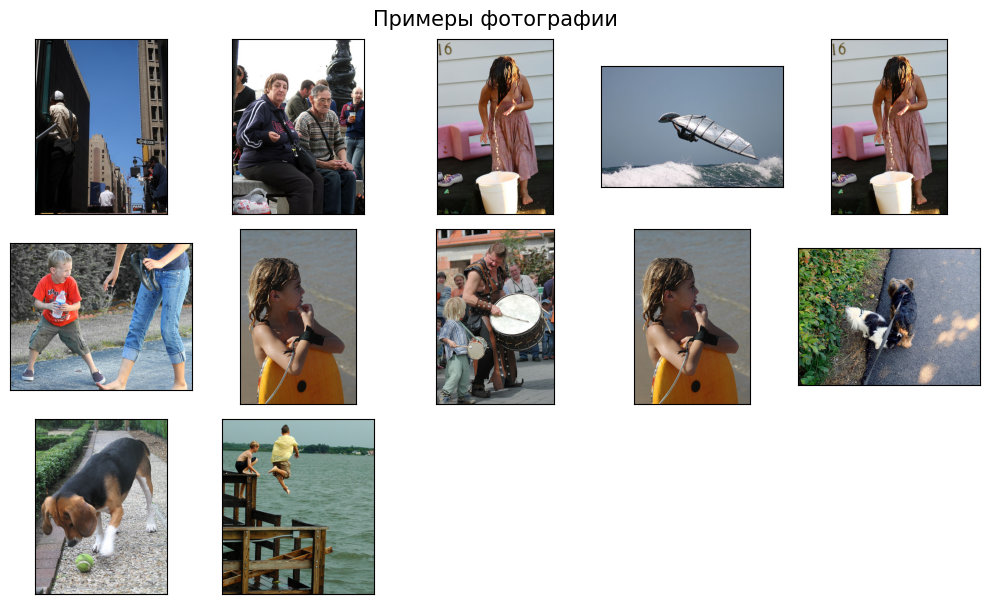

In [ ]:
open_image(data=train_dataset, from_=5810, to=5822, path=PATH, path_2='train_images' )

**Вывод** - В обучающем датасете 5822 строк, пропусков данных нет, полных дубликатов нет, уникальных изображений - 1000, т.е. часть изображений повторяется. Фотографии цветные, разных размеров.

### Загрузка данных CrowdAnnotations.tsv -  данные по соответствию изображения и описания, полученные с помощью краудсорсинга

In [ ]:
if os.path.exists(PATH):
    crowd_annotations = pd.read_csv(os.path.join(PATH, 'CrowdAnnotations.tsv'), sep='\t',
                                names=['image',
                                       'query_id',
                                       'final_score_people',
                                       'count_matches',
                                       'count_not_matches'])
else:
    print('Something is wrong')

In [ ]:
get_info(crowd_annotations)

'Вывод первых 10-ти строк датасета'

,image,query_id,final_score_people,count_matches,count_not_matches
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   image               47830 non-null  object 
 1   query_id            47830 non-null  object 
 2   final_score_people  47830 non-null  float64
 3   count_matches       47830 non-null  int64  
 4   count_not_matches   47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


None

Количество явных дубликатов: 0


In [ ]:
crowd_annotations.describe()

,final_score_people,count_matches,count_not_matches
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


**Вывод** - в данном датасете 47830 строк, пропусков нет, полных дубликатов нет, оценка соответсвия описания изображению (доля лиц признавших, что картинка соответсвует описанию) врьируется от 0 до 1.

### Загрузка данных ExpertAnnotations.tsv - данные по соответствию изображения и описания, полученные в результате опроса экспертов

In [ ]:
if os.path.exists(PATH):
    expert_annotations = pd.read_csv(os.path.join(PATH, 'ExpertAnnotations.tsv'), sep='\t',
                                names=['image',
                                       'query_id',
                                       '1_expert',
                                       '2_expert',
                                       '3_expert'])
else:
    print('Something is wrong')

In [ ]:
get_info(expert_annotations)

'Вывод первых 10-ти строк датасета'

,image,query_id,1_expert,2_expert,3_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   1_expert  5822 non-null   int64 
 3   2_expert  5822 non-null   int64 
 4   3_expert  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


None

Количество явных дубликатов: 0


In [ ]:
expert_annotations.describe()

,1_expert,2_expert,3_expert
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


**Вывод** - в данном датасете 5822 строк, пропусков нет, полных дубликатов нет, оценка всех экспертов варьируются в диапазоне от 1 до 4, что соответсвует описанию файла.

 ### Загрузка данных тестового датасета (test_queries.csv )

In [ ]:
if os.path.exists(PATH):
    test_dataset = pd.read_csv(os.path.join(PATH, 'test_queries.csv'), sep='|',
                           index_col=0)
else:
    print('Something is wrong')

In [ ]:
get_info(test_dataset)

'Вывод первых 10-ти строк датасета'

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adul...,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a ...,1232148178_4f45cc3284.jpg
8,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera...,1232148178_4f45cc3284.jpg
9,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green...,1232148178_4f45cc3284.jpg


<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


None

Количество явных дубликатов: 0


In [ ]:
test_dataset['image'].value_counts()

1177994172_10d143cb8d.jpg    5
3396275223_ee080df8b5.jpg    5
3487131146_9d3aca387a.jpg    5
3482859574_3908de3427.jpg    5
3466891862_9afde75568.jpg    5
                            ..
2687672606_275169c35d.jpg    5
2670637584_d96efb8afa.jpg    5
2597308074_acacc12e1b.jpg    5
2552438538_285a05b86c.jpg    5
989851184_9ef368e520.jpg     5
Name: image, Length: 100, dtype: int64

In [ ]:
test_dataset['query_text'] = test_dataset['query_text'].str.lower()
test_dataset.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


#### Для примера посмотрим несколько фотографий из тестового датасета. Для этого используем функцию open_image, написаную ранее.

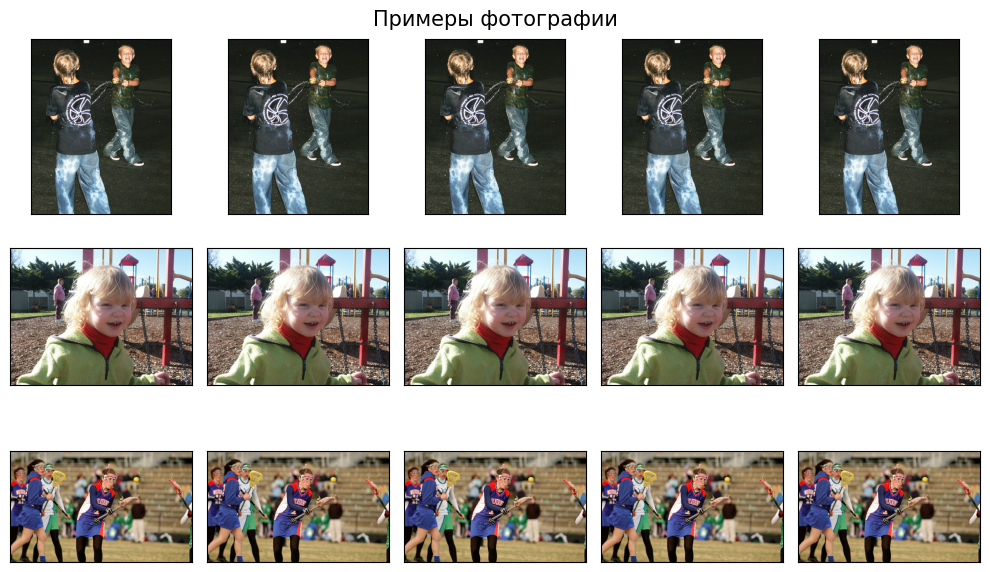

In [ ]:
open_image(data=test_dataset, from_=0, to=15, path=PATH, path_2='test_images')

#### Проверим не пересекаются ли фотографии в обучающем и тестовом датасетах.

In [ ]:
len(set(train_dataset['image']) & set(test_dataset['image']))

0

Пересечений нет

**Вывод** - В тестовом датасете 500 строк, пропусков данных нет, полных дубликатов нет, уникальных изображений - 100, т.е. каждая фотография встречается в датасете 5 раз, что также можно наглядно увидеть по выгрузке примеров изображений. Фотографии цветные, разных размеров. Фотографии из обучающей и тестовой выборки не пересекаются между собой.

**Общий вывод**:
На данном этапе были загружены и исследованы следующие файлы:
1. Обучающие данные (файл - train_dataset.csv). В обучающем датасете 5822 строк, пропусков данных нет, полных дубликатов нет, уникальных изображений - 1000, т.е. часть изображений повторяется. Фотографии цветные, разных размеров.

2. Данные по соответствию изображения и описания, полученные с помощью краудсорсинга (файл -CrowdAnnotations.tsv). В данном датасете 47830 строк, пропусков нет, полных дубликатов нет, оценка соответсвия описания изображению (доля лиц признавших, что картинка соответсвует описанию) врьируется от 0 до 1.

3. Данные по соответствию изображения и описания, полученные в результате опроса экспертов (файл - ExpertAnnotations.tsv). в данном датасете 5822 строк, пропусков нет, полных дубликатов нет, оценка всех экспертов варьируются в диапазоне от 1 до 4, что соответсвует описанию файла.

4. Тестовые данные (файл - test_queries.csv). В тестовом датасете 500 строк, пропусков данных нет, полных дубликатов нет, уникальных изображений - 100, т.е. каждая фотография встречается в датасете 5 раз, что также можно наглядно увидеть по выгрузке примеров изображений. Фотографии цветные, разных размеров. Фотографии из обучающей и тестовой выборки не пересекаются между собой.

## Подготовка данных
Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения. Необходимо провести агрегацию оценок и перевести их значение в диапазон от 0 до 1, т.к. модель должна возвращать на выходе вероятность соответствия изображения тексту. будем использовать только оценки экспертов.

### Объеденим оценки экспертов по следующему принципу:
1. Если есть одинаковые оценки, то будем выбирать наиболее часто встречающуюся оценку (используем принцип голосование большинства)
2. Если оценки разные - берем среднюю оценку (сумма трех оценок/3)

Также нам надо привести оценки в диапазон от 0 до 1. Попробуем для этого использовать min-max стандартизатор. Формула: (x - min)/(max - min). min=1, max=4.

In [ ]:
def get_fin_score(row):
    if row['1_expert'] != row['2_expert'] != row['3_expert']:
        mean_score = (row['1_expert'] + row['2_expert'] + row['3_expert'])/3
        row['agg_score'] = (mean_score - 1)/3
    else:
        score =mode([row['1_expert'], row['2_expert'], row['3_expert']])
        row['agg_score'] = (score - 1)/3
    return row

In [ ]:
expert_annotations = expert_annotations.apply(get_fin_score, axis=1)
expert_annotations[40:50]

,image,query_id,1_expert,2_expert,3_expert,agg_score
40,1119015538_e8e796281e.jpg,2534502836_7a75305655.jpg#2,2,3,4,0.666667
41,1119015538_e8e796281e.jpg,348380010_33bb0599ef.jpg#2,2,3,3,0.666667
42,1119015538_e8e796281e.jpg,387830531_e89c192b92.jpg#2,2,3,3,0.666667
43,1119015538_e8e796281e.jpg,416106657_cab2a107a5.jpg#2,4,4,4,1.000000
44,1122944218_8eb3607403.jpg,2894217628_f1a4153dca.jpg#2,1,1,1,0.000000
45,1122944218_8eb3607403.jpg,3044500219_778f9f2b71.jpg#2,1,1,1,0.000000
46,1122944218_8eb3607403.jpg,3220126881_b0a4f7cccb.jpg#2,1,1,1,0.000000
47,1122944218_8eb3607403.jpg,3325497914_f9014d615b.jpg#2,2,3,4,0.666667
48,1122944218_8eb3607403.jpg,3720366614_dfa8fe1088.jpg#2,1,1,1,0.000000
49,1131800850_89c7ffd477.jpg,166507476_9be5b9852a.jpg#2,1,1,1,0.000000


In [ ]:
expert_annotations['agg_score'].describe()

count    5822.000000
mean        0.208157
std         0.285431
min         0.000000
25%         0.000000
50%         0.000000
75%         0.333333
max         1.000000
Name: agg_score, dtype: float64

### Добавим столбец с агрегированной оценкой экспертов в тренировочный датасет.

In [ ]:
train_dataset = train_dataset.merge(expert_annotations, on=['image', 'query_id'], how='left')
train_dataset.head()

,image,query_id,query_text,1_expert,2_expert,3_expert,agg_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,2,2,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,4,4,4,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000


In [ ]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5822 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   1_expert    5822 non-null   int64  
 4   2_expert    5822 non-null   int64  
 5   3_expert    5822 non-null   int64  
 6   agg_score   5822 non-null   float64
dtypes: float64(1), int64(3), object(3)
memory usage: 363.9+ KB


 ### Удалим ненужные столбцы 1_expert	2_expert	3_expert

In [ ]:
train_dataset = train_dataset.drop(['1_expert','2_expert', '3_expert'], axis=1)


In [ ]:
train_dataset.head(10)

,image,query_id,query_text,agg_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


In [ ]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   agg_score   5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 227.4+ KB


**Вывод** - на данном этапе мы получили единую оценку соответсвия тектового описания изображению, котрая изменяется в димапазоне от 0 до 1. 0 - не соответсвует, 1 - полностью соответсвует. Для этого мы использовали только оценку экспертов.

## Проверка данных
В некоторых странах, где работает компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.
В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:
⎪ This image is unavailable in your country in compliance with local laws
Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.
(Создайте список слов которые, по вашему мнению, могут попадать под юридические ограничения. Исключите из обучающего датасета пары, которые, исходя из подготовленного вами списка слов, могут попадать под юридические ограничения.)

### Создадим словарь 'плохих' слов, включив в него слова, которые могут обозначать лиц в возрасте до 16 лет.

In [ ]:
bad_words = [
    'child',
    'children',
    'baby',
    'babies',
    'boy',
    'boys',
    'girl',
    'girls',
    'kid',
    'kids',
    'infant',
    'infants',
    'toddler',
    'toddlers',
    'teenager',
    'teenagers',
    'schoolboy',
    'schoolgirl',
    'pupil',
    'pupils',
    'youngster',
    'youngsters'
]

### Приведем слова в столбце query_text к нижнему регистру

In [ ]:
train_dataset['query_text'] = train_dataset['query_text'].str.lower()
train_dataset.head()

,image,query_id,query_text,agg_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000


### Напишем функцию для поиска описаний, в которых встречаются слова, обозначающие лиц в возрасте до 16 лет.

In [ ]:
def clear_text (row):
    text = row['query_text'].split()
    if [i for i in text if i in bad_words]:
        row['block'] = 1
    else:
        row['block'] = 0
    return row


In [ ]:
train_dataset = train_dataset.apply(clear_text, axis=1)

In [ ]:
train_dataset.head(15)

,image,query_id,query_text,agg_score,block
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.333333,1
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,1.000000,1
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.333333,1
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1


In [ ]:
train_dataset['block'].value_counts()

0    4263
1    1559
Name: block, dtype: int64

### Выборочно посмотрим, какие описания попали в категорию 'bloc'

In [ ]:
train_dataset.query('block==1')['query_text'].sample(10)

5657          two babies in sweaters playing with a toy .
3153    two women with a baby carriage in a building n...
5765    a girl is swinging and looking down with her h...
2188    a young boy , playing basketball , is getting ...
2308    a little boy in a striped shirt is standing be...
1697    a large white dog , a girl , and a police car ...
220     a man and young girl eat a meal on a city stre...
4803              a boy plays with a noodle by the pool .
138        a young boy in a swimming suit sits in water .
5436    children sit in front of a computer while thei...
Name: query_text, dtype: object

### Выборочно посмотрим, какие изображения соответсвуют этим описаниям (номер изображения указан в столбце query_id из которого надо убрать два последних символа #2)

#### Отберем 20 фотографий, в описании которых встречаются лица до 16 лет.

In [ ]:
ex_photo = list(train_dataset.query('block==1')['query_id'].sample(20))
ex_photo = [i[:-2] for i in ex_photo]
ex_photo

['197504190_fd1fc3d4b7.jpg',
 '444057017_f1e0fcaef7.jpg',
 '533979933_a95b03323b.jpg',
 '2707873672_15e6b5d54b.jpg',
 '2501595799_6316001e89.jpg',
 '2533642917_a5eace85e6.jpg',
 '2647049174_0fb47cee2e.jpg',
 '2577972703_a22c5f2a87.jpg',
 '2061354254_faa5bd294b.jpg',
 '3295391572_cbfde03a10.jpg',
 '3537400880_8f410d747d.jpg',
 '2480850054_de3433b54a.jpg',
 '566397227_a469e9e415.jpg',
 '3471841031_a949645ba8.jpg',
 '2479652566_8f9fac8af5.jpg',
 '2251747182_6b67a3ab8b.jpg',
 '3433982387_3fa993cf5a.jpg',
 '2208310655_a3d83080c5.jpg',
 '3545652636_0746537307.jpg',
 '2616643090_4f2d2d1a44.jpg']

#### Напишем функцию для загрузки изображений, на вход она принимает спимок с номерами фотографий, количество выводимых изображений, пути к файлам с фотографиями

In [ ]:
def open_image_2 (sample, b, path, path2):

    fig = plt.figure(figsize=(10,10))

    for i in range(b):
        fig.add_subplot(5, 5, i+1)
        if os.path.exists(path):
            image = Image.open(Path(path, path2, sample[i]))

        else:
            print('Something is wrong')
        plt.suptitle('Примеры фотографии', fontsize=15)
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

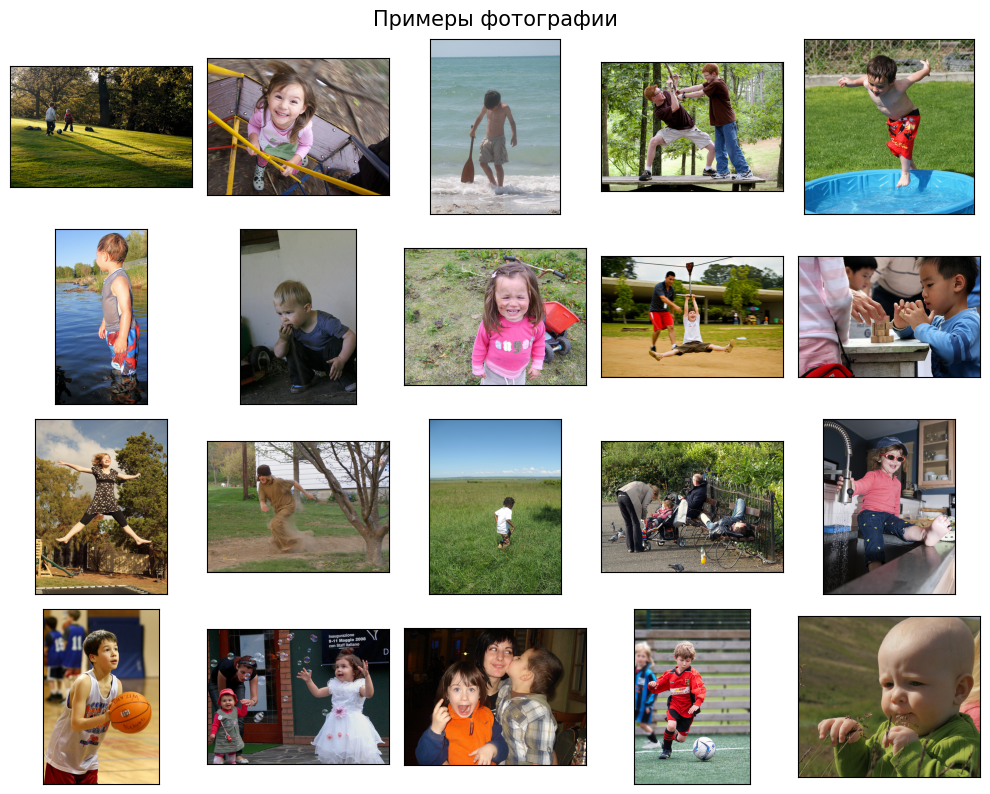

In [ ]:
open_image_2(sample=ex_photo, b=20, path=PATH, path2='train_images')

Исходя из примеров описаний и фотографий, отбор произведен корректно. Исключим из обучающего датасета пары изображений и описаний, где есть или фотографии детей или описание детей, в соответсвии с законодательством.

In [ ]:
data_train = train_dataset.query('block==0')

In [ ]:
data_train.reset_index(inplace=True, drop=True)

In [ ]:
data_train.head()

,image,query_id,query_text,agg_score,block
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.000000,0
1,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.333333,0
2,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.333333,0
3,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.333333,0
4,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.000000,0


In [ ]:
print(data_train['block'].value_counts())
data_train.info()

0    4263
Name: block, dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4263 entries, 0 to 4262
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4263 non-null   object 
 1   query_id    4263 non-null   object 
 2   query_text  4263 non-null   object 
 3   agg_score   4263 non-null   float64
 4   block       4263 non-null   int64  
dtypes: float64(1), int64(1), object(3)
memory usage: 166.6+ KB


**Вывод** - на данном этапе исключили из обучающего датасета пары фотографий и описаний к фотографиям, где встречается описание лиц до 16 лет и/или фото детей до 16 лет, в соответсвии с законодательством.

## Векторизация текстов

### Проведем векторизацию текстов используя предобученный трансфоромер BERT.  

In [ ]:
model = transformers.BertModel.from_pretrained('bert-base-uncased')
tokenizer = transformers.BertTokenizer.from_pretrained('bert-base-uncased')

tokenized = data_train['query_text'].apply(
    lambda x: tokenizer.encode(x, add_special_tokens=True, max_length=128, truncation=True))

max_len = max([len(i) for i in tokenized.values])
print(max_len)
padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])

attention_mask = np.where(padded != 0, 1, 0)

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

36


### Получаем эмбеддинги с помощью модели bert-base-uncased, загружая в нее данные по частям.

In [ ]:
batch_size = 147
embeddings = []
for i in notebook.tqdm(range(padded.shape[0] // batch_size)):
        batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)])
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])

        with torch.no_grad():
            batch_embeddings = model(batch, attention_mask=attention_mask_batch)

        embeddings.append(batch_embeddings[0][:,0,:].cpu().numpy())

  0%|          | 0/29 [00:00<?, ?it/s]

In [ ]:
features_text = np.concatenate(embeddings)
features_text.shape

(4263, 768)

**Вывод** - на данном этапе получили вектора текстовых описаний изображений с помощью трансформера bert-large-uncased. Получили размер вектора -1024

## Векторизация изображений

### Для векторизации будеи использолвать сверточную сеть ResNet18, исключив полносвязный слой, который отвечает за конечное предсказание. Также мы будем использовать претренированную модель, поэтому заморозим веса.

In [ ]:
resnet = models.resnet18(pretrained=True)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 60.4MB/s]


In [ ]:
for param in resnet.parameters():
    param.requires_grad_(False)

In [ ]:
print(list (resnet.children()))

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU(inplace=True), MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False), Sequential(
  (0): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bia

#### Уберем один последний слой и переведем модель в режим предсказания

In [ ]:
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules)
resnet.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

#### Приводим изображения в нужный формат, для этого изменяем размер картинки, вырезаем центр и нормализуем.

In [ ]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
])

#### Получаем вектора изображений

In [ ]:
image_embeddings = []

train_photos = list(data_train['image'])
for i in notebook.tqdm(range(len(train_photos ))):
    if os.path.exists(PATH):
        image = Image.open(Path(PATH,'train_images', train_photos[i])).convert('RGB')
    else:
        print('Something is wrong')
    image_tensor  = preprocess(image)
    output_tensor = resnet(image_tensor.unsqueeze(0)).flatten()
    image_embeddings.append(output_tensor.cpu().numpy())

  0%|          | 0/4263 [00:00<?, ?it/s]

In [ ]:
features_image = np.asarray(image_embeddings)


In [ ]:
features_image.shape

(4263, 512)

**Вывод** - на данном этапе получили векторы изображений с помощью ResNet18  размерностью 25088, размер вектора изображения отличаеся от размера вектора текстового описания.

## Объединяем вектора текстов и изображений

In [ ]:
features = np.concatenate((features_image, features_text), axis=1)


In [ ]:
features.shape

(4263, 1280)

In [ ]:
target = np.array(data_train['agg_score'])

In [ ]:
target.shape

(4263,)

## Обучение модели предсказания соответствия

### Разбиваем обучающую выборку на тренировочную и тестовую выборки. Делаем это с помощью GroupShuffleSplit так, чтобы строки с одинаковыми изображениями содержались либо в тестовом, либо в тренировочном датасете.

In [ ]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=RANDOM_STATE)
train_indices, test_indices = next(gss.split(X=features, y=target, groups=data_train['image']))
train_features, test_features = features[train_indices], features[test_indices]
train_target, test_target = target[train_indices], target[test_indices]

In [ ]:
print(train_features.shape)
print(train_target.shape)
print(test_features.shape)
test_target.shape

(3424, 1280)
(3424,)
(839, 1280)


(839,)

### Проведем масштабирование признаков, используя StandardScaler()

In [ ]:
scaler = StandardScaler().fit(train_features)
train_features = scaler.transform(train_features)
test_features = scaler.transform(test_features)

### Исследуем модель линейной регресии.

Данную модель возьмем в качестве бейзлайна. У нас задача регресси, для таких задач обычно применяются метрики МАЕ, RMSE. MSE - не очень информативна в нашей задаче, т.к. значение ошибки возводится в квадрат. Посмотри на примере логистической регрессии значение данных метрик.


In [ ]:
%%time
model_lr = LinearRegression()
model_lr.fit(train_features, train_target)
predict_lr = model_lr.predict(test_features)
print('RMSE:', mean_squared_error(test_target, predict_lr, squared=False))
print('MAE:', mean_absolute_error(test_target, predict_lr))


RMSE: 5.791815950978385
MAE: 1.0219339462952524
CPU times: user 1.31 s, sys: 195 ms, total: 1.5 s
Wall time: 872 ms


**Вывод по метрике** Из полученных значений метрик видим , что метрика RMSE хуже (данная метрика сильнее реагирует на выбросы предсказаний, т.к. цель и предсказания возводяться в квадрат, а потом вычисляется разница), поэтому остановимся на метрике RMSE и будем оптимизировать ее.

**Вывод по модели** Данная модель не подходит для решения нашей задачи, т.к. отклонения очень большие, при условии, что значения таргета лежат в диапазоне от 0 до 1.

### Рассмотриим модель Ridge и подберем гиперпараметры для нее, используя GridSearchCV

In [ ]:
%%time
model_rd = Ridge(random_state=RANDOM_STATE, alpha = 9)
model_rd.fit(train_features, train_target)
predict_rd = model_rd.predict(test_features)
print('RMSE:', mean_squared_error(test_target, predict_rd, squared=False))




RMSE: 0.3297647012515996
CPU times: user 238 ms, sys: 91.8 ms, total: 330 ms
Wall time: 188 ms


### Рассмотрим полносвязную нейронную сеть

#### Подготовим данные

In [ ]:
x_train = torch.FloatTensor(train_features)
x_test = torch.FloatTensor(test_features)
y_train = torch.FloatTensor(train_target)
y_test = torch.FloatTensor(test_target)

In [ ]:
print(x_train)
print(x_train.size())
print(y_train.size())
print(x_test.size())
y_test.size()

tensor([[-6.6352e-01,  1.5930e+00,  1.1249e+00,  ..., -6.4040e-01,
          9.2358e-01,  3.0758e-01],
        [ 1.2759e+00,  1.2234e-02, -9.7433e-01,  ..., -6.4040e-01,
          9.2358e-01,  3.0758e-01],
        [-5.5604e-01,  3.1364e+00,  4.7395e-01,  ..., -6.4040e-01,
          9.2358e-01,  3.0758e-01],
        ...,
        [ 3.3555e-01, -7.2618e-01, -2.4122e-01,  ...,  4.9148e-01,
          5.8695e-02,  8.6768e-01],
        [ 8.9530e-01, -8.4934e-01,  1.9256e-02,  ..., -2.3397e-03,
          5.2639e-01,  3.8559e-01],
        [-4.9700e-01, -5.5473e-03, -6.0932e-01,  ...,  3.2562e-01,
         -9.2200e-01, -4.5419e-01]])
torch.Size([3424, 1280])
torch.Size([3424])
torch.Size([839, 1280])


torch.Size([839])

### Создаем класс для задания архитектуры нейронной сети. Так как у нас задача регресиии, то на выходном слое у нас будет 1 нейрон. На входе количество нейронов равно количеству признаков. Для задач регрессии на выходе в качестве функции активации лучше использовать линейную функцию, в скрытых слоях попробуем использовать функцию ReLU()

In [ ]:
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)
torch.use_deterministic_algorithms(True)

In [ ]:
class Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons):
            super(Net, self).__init__()

            self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
            self.act1 = nn.ReLU()
            self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
            self.act2 = nn.ReLU()
            self.fc3 = nn.Linear(n_hidden_neurons_2, n_out_neurons)


    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.fc3(x)

        return x

In [ ]:
net = Net(train_features.shape[1], 20, 15, 1)

In [ ]:
loss = nn.MSELoss()
optimizer = torch.optim.Adam(net.parameters(), lr=0.001)

test_loss_list = []
train_loss_list = []
num_epochs = 29
best_rmse = 20000

for epoch in range(num_epochs):
    train_preds = net.forward(x_train).flatten()
    train_loss = loss(train_preds, y_train)
    train_loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    net.eval()
    test_preds = net.forward(x_test).flatten()
    test_loss = loss(test_preds, y_test)
    rmse_test = torch.sqrt(test_loss).item()
    rmse_train = torch.sqrt(train_loss).item()
    test_loss_list.append(torch.sqrt(test_loss).item())
    train_loss_list.append(torch.sqrt(train_loss).item())
    if rmse_test < best_rmse:
        best_rmse = rmse_test
        best_epoch = epoch
        loss_train = rmse_train
        best_preds = test_preds
print(f'Best_epoch {best_epoch}, Best RMSE train {loss_train}, Best RMSE test {best_rmse}')

Best_epoch 28, Best RMSE train 0.18288373947143555, Best RMSE test 0.2557011842727661


Начала обучать с 7000 эпох, график показал, что в районе 30 эпохи идет переобучение модели. Поэтому остановилась на 29 эпохах

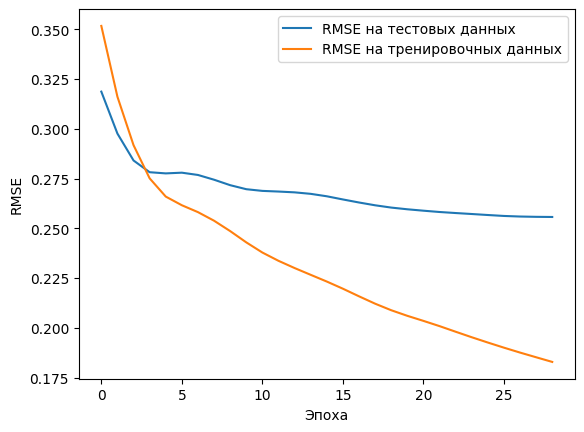

In [ ]:
plt.plot(test_loss_list, label='RMSE на тестовых данных')
plt.plot(train_loss_list, label='RMSE на тренировочных данных')
plt.xlabel('Эпоха')
plt.ylabel('RMSE')
plt.legend()
plt.show()

**Вывод**На данном этапе было протестировано несколько модлей LinearRegression, Ridge, трехслойная послносвязная нейронная сеть. Нейронная сеть показала лучшие результаты, поэтому тестировать будем на ней.

## Тестирование модели
Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки test_images, выберите случайные 10 запросов из файла test_queries.csv и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.


### Создадим вектора всех тестовых изображений

In [ ]:
df_image = pd.DataFrame(test_dataset.image.unique(), columns=['image'])
print(len(df_image))

100


In [ ]:
image_embeddings_test = []
resnet.to(device)
test_photos = list(df_image['image'])
for i in notebook.tqdm(range(len(test_photos))):
    if os.path.exists(PATH):
        image = Image.open(Path(PATH,'test_images', test_photos[i])).convert('RGB')
    else:
        print('Something is wrong')
    image_tensor  = preprocess(image)
    output_tensor = resnet(image_tensor.unsqueeze(0)).flatten()
    image_embeddings_test.append(output_tensor.cpu().numpy())

  0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
test_image = np.asarray(image_embeddings_test)

In [ ]:
test_image.shape

(100, 512)

### Получим вектора уникальных описаний картинок из тестовго датасета

In [ ]:
def get_embed(data, model, tokenizer ):
    df_text = pd.DataFrame(data, columns=['text'])
    tokenized = df_text['text'].apply(lambda x: tokenizer.encode(x, add_special_tokens=True, max_length=128, truncation=True))
    max_len = max([len(i) for i in tokenized.values])
    padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])
    attention_mask = np.where(padded != 0, 1, 0)
    embeddings_text = []
    batch = torch.LongTensor(padded)
    attention_mask_batch = torch.LongTensor(attention_mask)
    with torch.no_grad():
        batch_embeddings = model(batch, attention_mask=attention_mask_batch)

    embeddings_text.append(batch_embeddings[0][:,0,:].cpu().numpy())
   
    return embeddings_text

### Напишем функцию для получения наиболее схожего изображения с введенным описанием для нейросети.

In [ ]:
def get_picture_net(text):
    text_split = text.split()

    if [i for i in text_split if i in bad_words]: #проверяем не нужно ли вывести на экран предупреждение
        print('')
        print(text)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = get_embed(model=model, data=[text], tokenizer=tokenizer) #получаем эмбеддинг текста
        X = np.concatenate((
            test_image,
            np.resize(text_embed, (test_image.shape[0],768))),
            axis=1)  #объединяем вектора тестовых картинок с эмбеддингом текста
        X = scaler.transform(X)
        X = torch.FloatTensor(X)
        with torch.no_grad():
            predictions = net.forward(X).flatten() # получаем предсказания оценок
        df = pd.concat([df_image, pd.Series(np.reshape(predictions, (predictions.shape[0])), name='pred')], axis=1) #добавляем оценки к номерам картинок

        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками

        print('')
        print(text)
        print('')

        fig = plt.figure(figsize=(20,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(len(top)):
            fig.add_subplot(1, 6, i+1)
            if os.path.exists(PATH):
                image = Image.open(Path(PATH, 'test_images', top[i])).convert('RGB')
            else:
                print('Something is wrong')

            plt.suptitle('Примеры фотографии', fontsize=15)
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(test_dataset['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            if os.path.exists(PATH):
                 image = Image.open(Path(PATH, 'test_images', test_dataset.iloc[test_dataset[test_dataset['query_text'] == text].index[0]]['image']))
            else:
                print('Something is wrong')
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        plt.show()

### Выбираем случайные запросы

In [ ]:
samples = test_dataset.sample(10)
text_test = list(samples['query_text'])
text_test

['a dog is wearing jeans and a blue and yellow shirt with a black vehicle in the background .',
 'while holding tight to the ball , the man in red socks is getting tackled .',
 'a dog is dressed in a shirt and pants on the side of the road .',
 'a biker rides down the street .',
 'a kickboxer jumping for a kick',
 'a young boy wearing a red shirt stands in the street with his arms open wide .',
 'a woman in purple with two children in the mouth of a cave .',
 'a little girl dressed in a pink shirt , blue shorts and a pink hair ribbon feeding ducks that are swimming in water .',
 'a family standing in a rock cave with some of their belongings in the background',
 'three people are looking into photographic equipment .']

### Получаем пять наиболее схожих изображений для каждого запрооса


a dog is wearing jeans and a blue and yellow shirt with a black vehicle in the background .



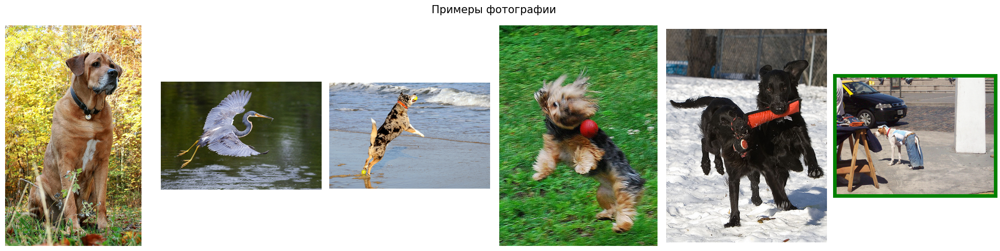


while holding tight to the ball , the man in red socks is getting tackled .



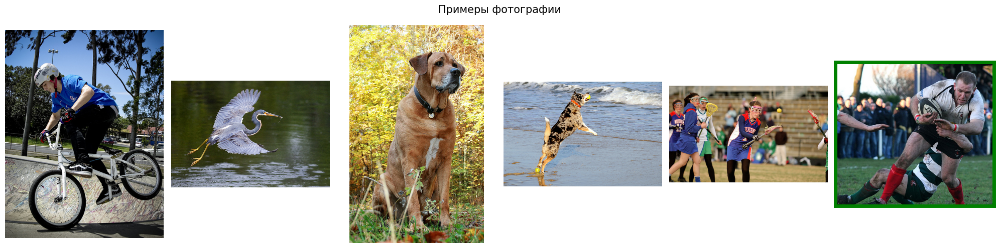


a dog is dressed in a shirt and pants on the side of the road .



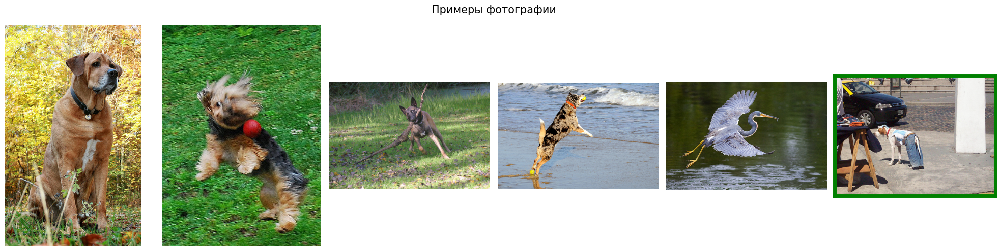


a biker rides down the street .



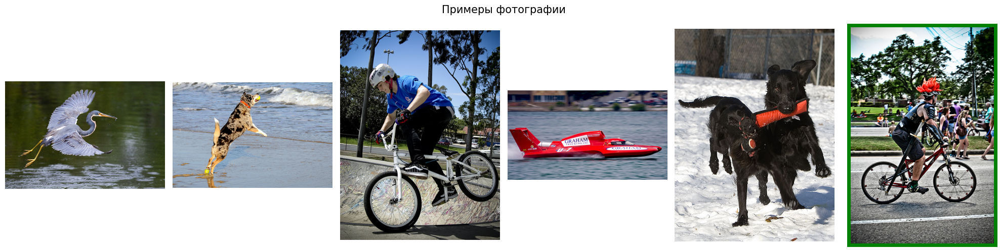


a kickboxer jumping for a kick



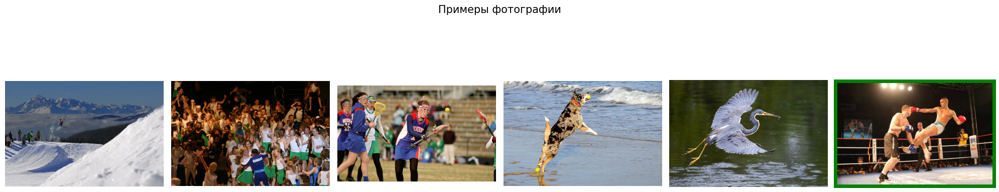


a young boy wearing a red shirt stands in the street with his arms open wide .

This image is unavailable in your country in compliance with local laws.


a woman in purple with two children in the mouth of a cave .

This image is unavailable in your country in compliance with local laws.


a little girl dressed in a pink shirt , blue shorts and a pink hair ribbon feeding ducks that are swimming in water .

This image is unavailable in your country in compliance with local laws.


a family standing in a rock cave with some of their belongings in the background



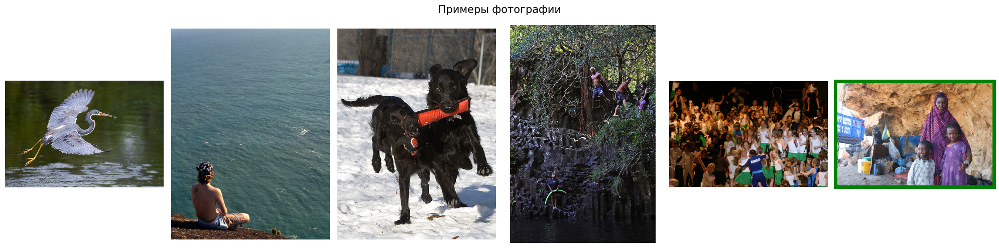


three people are looking into photographic equipment .



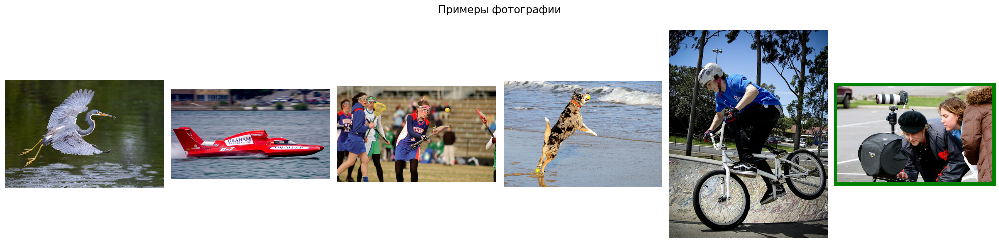

In [ ]:
for t in text_test:
    get_picture_net(t)

**Вывод**: Модель выдает картинки не точно, но среди 5 изображений попадаются схожие по описанию картинки.

**Итоговый вывод**:
Перед нами стояла задача разработать демонстрационную версию поиска изображений по запросу. Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

Для этого было сделано следующее:

1. Были загружены и исследованы следующие файлы:

Обучающие данные (файл - train_dataset.csv). В обучающем датасете 5822 строк, пропусков данных нет, полных дубликатов нет, уникальных изображений - 1000, т.е. часть изображений повторяется. Фотографии цветные, разных размеров.

Данные по соответствию изображения и описания, полученные с помощью краудсорсинга (файл -CrowdAnnotations.tsv). В данном датасете 47830 строк, пропусков нет, полных дубликатов нет, оценка соответсвия описания изображению (доля лиц признавших, что картинка соответсвует описанию) врьируется от 0 до 1.

Данные по соответствию изображения и описания, полученные в результате опроса экспертов (файл - ExpertAnnotations.tsv). в данном датасете 5822 строк, пропусков нет, полных дубликатов нет, оценка всех экспертов варьируются в диапазоне от 1 до 4, что соответсвует описанию файла.

Тестовые данные (файл - test_queries.csv). В тестовом датасете 500 строк, пропусков данных нет, полных дубликатов нет, уникальных изображений - 100, т.е. каждая фотография встречается в датасете 5 раз, что также можно наглядно увидеть по выгрузке примеров изображений. Фотографии цветные, разных размеров. Фотографии из обучающей и тестовой выборки не пересекаются между собой.

2. Получили единую оценку соответсвия тектового описания изображению, котрая изменяется в димапазоне от 0 до 1. 0 - не соответсвует, 1 - полностью соответсвует. Для этого мы использовали только оценку экспертов.

3. Исключили из обучающего датасета пары фотографий и описаний к фотографиям, где встречается описание лиц до 16 лет и/или фото детей до 16 лет, в соответсвии с законодательством.

4. Получили вектора текстовых описаний изображений с помощью трансформера bert-base-uncased. Получили размер вектора -768

5. Получили векторы изображений с помощью ResNet18 размерностью 512, размер вектора изображения отличаеся от размера вектора текстового описания.

6. Подготовили данные для обучения и протестировали несколько моделей LinearRegression, Ridge, трехслойная послносвязная нейронная сеть. Нейронная сеть показала лучший результаты, поэтому тестировать будем на ней.

7. Написали функцию для выведения наиболее схожих пяти изображений для тектового описания их тестовой выборки. Далее выбрали 10 случайных тестовых описаний и получили для них 5 наиболее схожие изображения. Модель плохо предсказывает изображения. Часто ошибается на фотографиях и описаниях детей, тк не проходила на них обучение. Также учли, что если запрос содержит слова, которые описывают лиц до 16 лет выдается предупреждение.

Таким образом данный подход не очень хорошо работает, по сути выдает картинки с схожим описанием.
Попробуем использовать готовое решение с помщью CLIP.

## Так как не удалось получить хорошие результаты, рассмотри готовое коробочное решение с моделью clip-ViT-B-32

In [ ]:
model_clip = SentenceTransformer('clip-ViT-B-32')

modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/1.91k [00:00<?, ?B/s]

0_CLIPModel/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

0_CLIPModel/config.json:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

0_CLIPModel/preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

0_CLIPModel/vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

0_CLIPModel/special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

0_CLIPModel/tokenizer_config.json:   0%|          | 0.00/604 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

### Создадим список с путями к тестовым изображениям и получим их эмбеддинги

In [ ]:
image_names = list(glob.glob(str(Path(PATH, 'test_images', '*.jpg'))))
imgage_emb = model_clip.encode([Image.open(filepath) for filepath in image_names], batch_size=10, convert_to_tensor=True, show_progress_bar=True)

Batches:   0%|          | 0/10 [00:00<?, ?it/s]

### Создадим функцию, которая ищет изображение по тектовомe описанию

In [ ]:
def search(query):
    query_split = query.split()
    if [i for i in query_split if i in bad_words]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print(query)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        query_emb = model_clip.encode([query], convert_to_tensor=True, show_progress_bar=False) #получаем эмбеддинг запроса
        # Используем функцию util.semantic_search, которая вычисляет косинусную схожесть
        # между эмбеддингом запроса и всеми картинками из базы.
        # Далее функция возвращает top_k картинок с наивысшим рейтингом
        hits = util.semantic_search(query_emb, imgage_emb, top_k=5)[0]
        print('')
        print(query)
        print('')

        fig = plt.figure(figsize=(20,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(hits[i]['score'], 2))
            image = Image.open(image_names[hits[i]['corpus_id']])
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if query in list(test_dataset['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            if os.path.exists(PATH):
                 image = Image.open(Path(PATH, 'test_images', test_dataset.iloc[test_dataset[test_dataset['query_text'] == query].index[0]]['image']))
            else:
                print('Something is wrong')
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        plt.show()


### Выбираем 5 случайных текстовых запросов

In [ ]:
samples = test_dataset.sample(5)
queries = list(samples['query_text'])
queries

['a tennis player wearing a blue shirt raises his hands and smiles .',
 'a long-haired brown and white dog carries a snowball in his mouth .',
 'red boat marked graham races across water .',
 'a girl on skis in snow .',
 "a small girl sitting on a man 's back ."]

### Ищем схожие изображения


a tennis player wearing a blue shirt raises his hands and smiles .



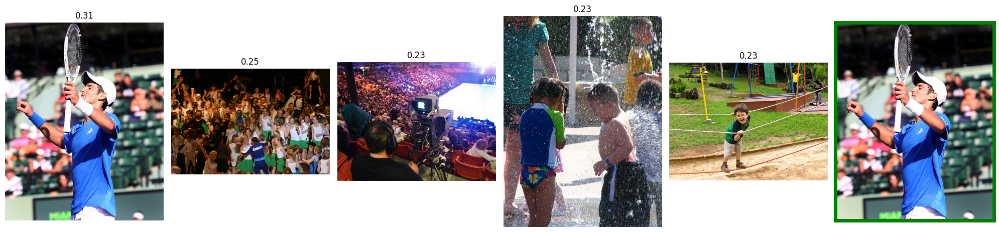


a long-haired brown and white dog carries a snowball in his mouth .



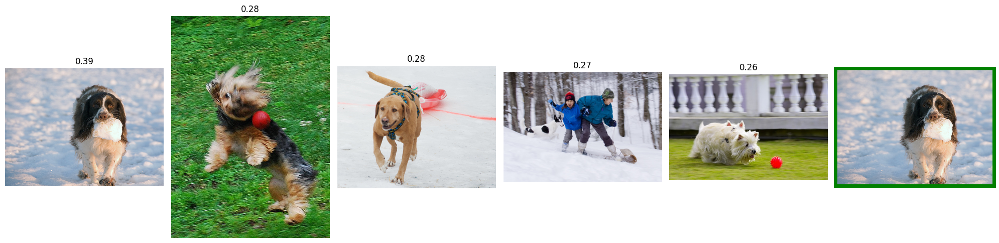


red boat marked graham races across water .



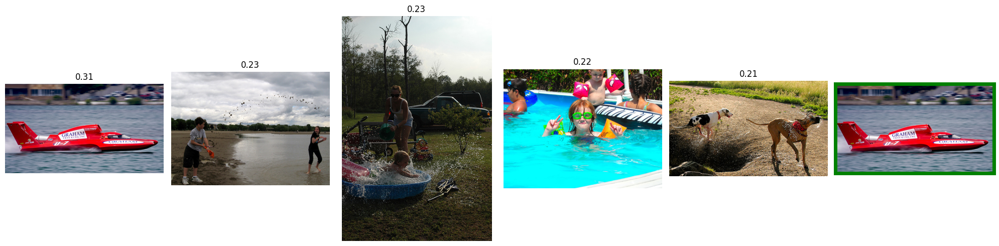


a girl on skis in snow .

This image is unavailable in your country in compliance with local laws.


a small girl sitting on a man 's back .

This image is unavailable in your country in compliance with local laws.



In [ ]:
for query in queries:
    search(query)

**Вывод** Модель clip-ViT-B-32 отработала хорошо, все изображения определены верно.